In [ ]:
using MatrixProductBP, MatrixProductBP.Models
using IndexedGraphs, DelimitedFiles, Plots, Statistics, LaTeXStrings, Random
import ProgressMeter; ProgressMeter.ijulia_behavior(:clear)
import Measurements: value, ±
using Graphs
using JLD2
using Unzip
using MPSExperiments
include("../aux/meanfield.jl");

In [ ]:
include("../../telegram/notifications.jl");

In [ ]:
T = 10^4     # final time
ρ = 0.1   # prob. of recovery
γ = 0.5    # prob. of being zero patient
k = 3;

In [ ]:
λs = 0.05:0.01:0.09;

## Meanfield

In [ ]:
N = 10^3
g = IndexedGraph(random_regular_graph(N, k))
p_dmp_disc, p_ibmf_disc, p_cme_disc = map(λs) do λ
    p_dmp_disc, = dmp_disc(T, 1.0, g, λ, ρ, fill(γ, nv(g)))     
    p_ibmf_disc = ibmf_disc(T, 1.0, g, λ, ρ, fill(γ, nv(g)))
    p_cme_disc, = cme_disc(T, 1.0, g, λ, ρ, fill(γ, nv(g)))
    p_dmp_disc, p_ibmf_disc, p_cme_disc
end |> unzip;

In [ ]:
pl_mc1 = map(eachindex(λs)) do a
    pl = plot(; xlabel="time", ylabel="prob(I)", title="λ=$(λs[a])")
    plot!(pl, 0:T, mean(p_dmp_disc[a]), label="DMP")
    plot!(pl, 0:T, mean(p_ibmf_disc[a]), label="IBMF")
    plot!(pl, 0:T, mean(p_cme_disc[a]), label="CME")
    pl
end

plot(pl_mc1...)

## Montecarlo

In [27]:
Ts = fill(2000, length(λs))
@assert length(Ts) == length(λs);

In [ ]:
p_mc = map(eachindex(λs)) do a
    λ = λs[a]
    sis = SIS(g, λ, ρ, Ts[a]; γ=fill(γ, N))
    bp = mpbp(sis)
    sms = SoftMarginSampler(bp)
    nsamples = 5*10^3
    sample!(sms, nsamples)
    b_mc = marginals(sms)
    p_mc = [[value(bb[INFECTIOUS]/sum(bb)) for bb in b] for b in b_mc]
    println("λ=$λ done. $a of $(length(λs))")
    p_mc
end;

base64 binary data: UNY+pgt/AAAAmupAC38AAAEAAAAAAAAAAJrqQAt/AADQVji6C38AAACa6kALfwAAUJrqQAt/AAAAAAAAAAAAABBDRqYLfwAAAQAAAAAAAADwmupAC38AAAAAAAAAAAAAUNY+pgt/AADwmupAC38AAAEAAAAAAAAA8JrqQAt/AADQVji6C38AAPCa6kALfwAAQJs=                  |  ETA: 0:24:20SoftMargin sampling  76%|████████████████████████▌       |  ETA: 0:06:22m                                                                                                                                    
SoftMargin sampling 100%|████████████████████████████████| Time: 0:27:56
Marginals from Soft Margin 100%|█████████████████████████| Time: 0:01:11


λ=0.05 done. 1 of 5


base64 binary data: AgAAAAAAAAAEiAgAAAAAAAIAAAAAAAAAAgAAAAAAAAAAAAAAAAAAAOIQAAAAAAAApgIAAAAAAAAAAAAAAAAAAADenF4NfwAA8JMcaQt/AAACAAAAAAAAAASICAAAAAAAAgAAAAAAAAACAAAAAAAAAAAAAAAAAAAAYjJVMCqp6z96Nqs+V1vBPwAAAAA=
SoftMargin sampling 100%|████████████████████████████████| Time: 0:22:33SoftMargin sampling  99%|███████████████████████████████▊|  ETA: 0:00:10                                                                                                                                                   
Marginals from Soft Margin  99%|████████████████████████▉|  ETA: 0:00:00

λ=0.06 done. 2 of 5


SoftMargin sampling 100%|████████████████████████████████| Time: 0:23:00m35m
Marginals from Soft Margin 100%|█████████████████████████| Time: 0:01:10


λ=0.07 done. 3 of 5


SoftMargin sampling  60%|███████████████████▍            |  ETA: 0:09:00m:08

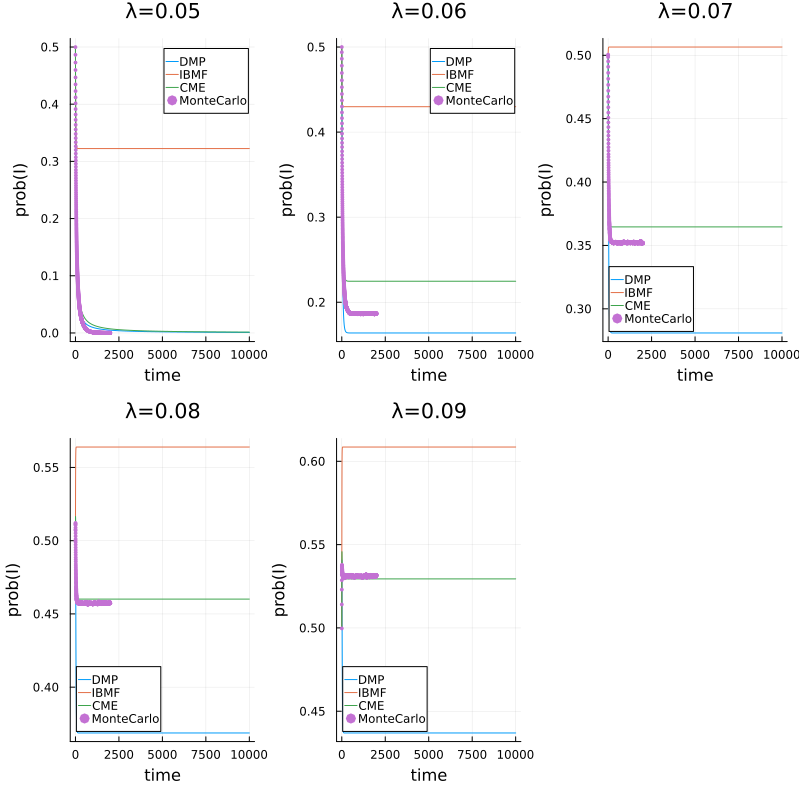

In [32]:
pl_mc = deepcopy(pl_mc1)
for (pl, p, T) in zip(pl_mc, p_mc, Ts)
    plot!(pl, 0:T, mean(p), st=:scatter, m=:o, label="MonteCarlo", msc=:auto, ms=2)
end
plot(pl_mc..., size=(800,800))

## BP + VUMPS

In [ ]:
maxiter = 50
maxiter = 100
tol = 1e-15
maxiter_vumps = 100

ds = fill(14, length(λs))
@assert length(ds) == length(λs)

p_bp = map(eachindex(λs)) do a
    λ = λs[a]
    A0 = reshape([10 10; 0.2 0.2], 1,1,2,2)
    d = ds[a]
    A, _, εs, errs, ovls, beliefs, As = iterate_bp_vumps_mpskit(SISFactor(λ, ρ; α=5e-2), d; A0, tol, maxiter,
        maxiter_vumps=10)
    A, _, εs, errs, ovls, beliefs, As = iterate_bp_vumps_mpskit(SISFactor(λ, ρ; α=0.0), d; A0=A, tol, maxiter,
       maxiter_vumps)
    beliefs
end;

[ Info: VOMPS init:	err = 2.7758e-02
[ Info: VOMPS   1:	err = 1.2666209654e-02	time = 0.01 sec
[ Info: VOMPS   2:	err = 2.1840834878e-02	time = 0.01 sec
[ Info: VOMPS   3:	err = 2.0521359208e-02	time = 0.02 sec
[ Info: VOMPS   4:	err = 6.3622362981e-03	time = 0.03 sec
[ Info: VOMPS   5:	err = 3.6405781061e-04	time = 0.03 sec
[ Info: VOMPS   6:	err = 1.0719814246e-06	time = 0.05 sec
[ Info: VOMPS   7:	err = 8.9454229937e-12	time = 0.03 sec
[ Info: VOMPS conv 8:	err = 6.0333168721e-16	time = 0.20 sec


In [ ]:
pl_bp = deepcopy(pl_mc)
for (pl, p, d) in zip(pl_bp, p_bp, ds)
    hline!(pl, 0:T, p[end][2:2], label="BP+VUMPS d=$d", ls=:dash)
end
plot(pl_bp..., size=(800,800))

In [ ]:
@telegram "sis rrg meanfield"

In [ ]:
p_mc_ss = [mean(p[end-50:end]) for p in mean.(p_mc)]
p_dmp_ss = [p[end] for p in mean.(p_dmp_disc)]
p_cme_ss = [p[end] for p in mean.(p_cme_disc)]
p_ibmf_ss = [p[end] for p in mean.(p_ibmf_disc)]
p_bp_ss = [p[end][2] for p in p_bp];

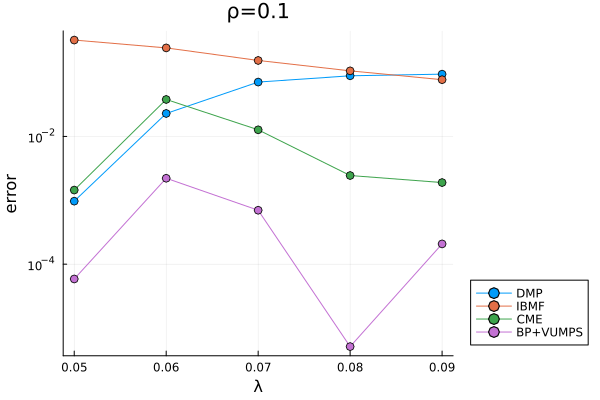

In [50]:
pl = plot(; xlabel="λ", ylabel="error", title="ρ=$ρ", yaxis=:log10, legend=:outerbottomright)
# plot!(pl, λs, p_mc_ss, label="MonteCarlo", m=:o)
plot!(pl, λs, abs.(p_dmp_ss - p_mc_ss), label="DMP", m=:o)
plot!(pl, λs, abs.(p_ibmf_ss - p_mc_ss), label="IBMF", m=:o)
plot!(pl, λs, abs.(p_cme_ss - p_mc_ss), label="CME", m=:o)
plot!(pl, λs, abs.(p_bp_ss - p_mc_ss), label="BP+VUMPS", m=:o)

In [ ]:
using JLD2
jldsave("../data/sis_rrg_meanfield2.jld2"; T, λs, ρ, γ, N,  p_dmp_disc, p_ibmf_disc, p_cme_disc, Ts,
    p_mc, ds, p_bp)